In [397]:
import requests
from PIL import Image
from io import BytesIO

import matplotlib.pyplot as plt
import numpy as np
import zipfile
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from random import randint
import tensorflow_hub as hub

# Import the necessary modules
from pyspark.sql import SparkSession

from tensorflow.keras.models import Sequential # Import the Sequential class from tensorflow.keras.models
from tensorflow.keras.layers import Flatten, Dense #Import Flatten and Dense
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


import requests
from PIL import Image
from io import BytesIO
# Import the statsmodels library
import statsmodels.api as sm
from sklearn.metrics import accuracy_score


In [398]:
# Early stopping to prevent overfitting and reduce training time
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Reduce learning rate when the validation loss plateaus
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

In [399]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [492]:
# !pip install pyspark


# Import Images and Labels

In [401]:
# Create a SparkSession
spark = SparkSession.builder.appName("MySparkApp").getOrCreate()

# Reading a CSV file into Spark DataFrame
# Replace '/content/metadata.csv' with the actual path to your CSV file
df = spark.read.csv("/content/metadata.csv", header=True, inferSchema=True)
df.show()

+-------------+-----+
|     filename|label|
+-------------+-----+
|  dirty_2.jpg|    1|
| clean_36.jpg|    0|
| clean_31.jpg|    0|
| dirty_69.jpg|    1|
|clean_113.jpg|    0|
|clean_102.jpg|    0|
| clean_43.jpg|    0|
| dirty_27.jpg|    1|
| dirty_53.jpg|    1|
| clean_55.jpg|    0|
| clean_28.jpg|    0|
| dirty_55.jpg|    1|
|clean_103.jpg|    0|
| dirty_31.jpg|    1|
| dirty_22.jpg|    1|
|dirty_118.jpg|    1|
| clean_62.jpg|    0|
| clean_51.jpg|    0|
| dirty_66.jpg|    1|
| clean_61.jpg|    0|
+-------------+-----+
only showing top 20 rows



In [402]:
img_size = (128, 128, 3)
basePath = '/content/drive/MyDrive/Colab Notebooks/Project_4/'
img_list = os.listdir(basePath + "Images/")

In [403]:
img_labels = []
for img in img_list:
  if 'clean' in img:
    img_labels.append(0)
  else:
    img_labels.append(1)

In [404]:
# saved images and labels to metadta.csv file
pd.DataFrame(zip(img_list,img_labels), columns=['filename', 'label']).to_csv(basePath + 'metadata.csv', index=False)

In [405]:
# building a list with images
images = []
for img in img_list:
  img = cv2.imread(basePath + 'Images/' + img, cv2.IMREAD_COLOR)
  images.append(cv2.resize(img, img_size[0:2])[:, :, ::-1])

In [64]:
len(images)

237

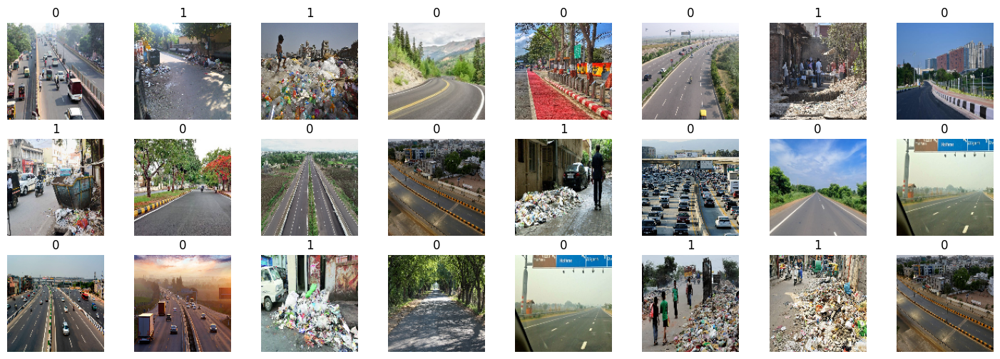

In [406]:
# Run model on image
# Ensure images is not empty before proceeding
plt.figure(figsize=(18, 6))
indexes = np.random.randint(len(images), size=24)
for i,x in enumerate(indexes):
  plt.subplot(3, 8, i+1)
  plt.title(img_labels[x])
  plt.imshow(images[x])
  plt.axis('off')

In [474]:
#data shape
# Check shapes of individual images
for i, img in enumerate(images):
  print(f"Shape of image {i}: {img.shape}")

# Find the common shape (e.g., minimum height and width)
min_height = min(img.shape[0] for img in images)
min_width = min(img.shape[1] for img in images)

# Resize images to the common shape
resized_images = [cv2.resize(img, (min_width, min_height)) for img in images]

# Create NumPy array from resized images
image_array = np.array(resized_images)

# Print the shape of the array
print(image_array.shape)

Shape of image 0: (128, 128, 3)
Shape of image 1: (128, 128, 3)
Shape of image 2: (128, 128, 3)
Shape of image 3: (128, 128, 3)
Shape of image 4: (128, 128, 3)
Shape of image 5: (128, 128, 3)
Shape of image 6: (128, 128, 3)
Shape of image 7: (128, 128, 3)
Shape of image 8: (128, 128, 3)
Shape of image 9: (128, 128, 3)
Shape of image 10: (128, 128, 3)
Shape of image 11: (128, 128, 3)
Shape of image 12: (128, 128, 3)
Shape of image 13: (128, 128, 3)
Shape of image 14: (128, 128, 3)
Shape of image 15: (128, 128, 3)
Shape of image 16: (128, 128, 3)
Shape of image 17: (128, 128, 3)
Shape of image 18: (128, 128, 3)
Shape of image 19: (128, 128, 3)
Shape of image 20: (128, 128, 3)
Shape of image 21: (128, 128, 3)
Shape of image 22: (128, 128, 3)
Shape of image 23: (128, 128, 3)
Shape of image 24: (128, 128, 3)
Shape of image 25: (128, 128, 3)
Shape of image 26: (128, 128, 3)
Shape of image 27: (128, 128, 3)
Shape of image 28: (128, 128, 3)
Shape of image 29: (128, 128, 3)
Shape of image 30: (

In [413]:
# split data into training and testing
X_train, X_val, y_train, y_val = train_test_split(images, img_labels, test_size=0.1, random_state=42)

In [479]:
X_train = np.array(X_train)
y_train = np.array(y_train)
X_val = np.array(X_val)
y_val = np.array(y_val)


In [494]:
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_val shape: {y_val.shape}")


X_train shape: (213, 128, 128, 3)
y_train shape: (213,)
X_val shape: (24, 128, 128, 3)
y_val shape: (24,)


In [493]:
# Creating initial model
nn=Sequential()
nn.add(Flatten())
nn.add(Dense(128,activation='relu'))
nn.add(Dense(128,activation='relu'))
nn.add(Dense(1,activation='sigmoid'))
# Compile the model
nn.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

The first example image is this clean street above. We will plug this into the classifier to see what objects it detects.

In [497]:
probabilities = np.random.rand(5) # Generate 5 random probabilities

pred_class_index = probabilities.argmax()
print(f'Predicted class index: {pred_class_index}')

Predicted class index: 2


In [500]:
import tensorflow.keras as keras
from tensorflow.keras import layers
# Import the keras library from tensorflow

model = keras.Sequential(
    [
        layers.Dense(2, activation="relu", name="layer1"),
        layers.Dense(3, activation="relu", name="layer2"),
        layers.Dense(4, name="layer3"),
    ]
)
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary to ensure it's correctly loaded
model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ layer1 (Dense)                       │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ layer2 (Dense)                       │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ layer3 (Dense)                       │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [501]:
# Define the model
model = keras.Sequential(
    [
        layers.Dense(2, activation="relu", name="layer1", input_shape=(4,)),
        # Input shape is required for the first layer
        layers.Dense(3, activation="relu", name="layer2"),
        layers.Dense(4, name="layer3"),
    ]
)

# Print the model summary to see parameter and output shapes
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ layer1 (Dense)                       │ (None, 2)                   │              10 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ layer2 (Dense)                       │ (None, 3)                   │               9 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ layer3 (Dense)                       │ (None, 4)                   │              16 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 35 (140.00 B)

 Trainable params: 35 (140.00 B)

 Non-trainable params: 0 (0.00 B)

In [502]:
# Use a try-except block to handle potential errors during image loading
try:
    demoImage = cv2.imread('images/dirty22.jpg')

    # Check if image loading was successful
    if demoImage is None:
        raise FileNotFoundError("Image not found at the specified path.")

    # Check the shape and type of demoImage
    print(f"Image shape: {demoImage.shape}")
    print(f"Image dtype: {demoImage.dtype}")

    # If the image is not normalized (i.e., values are in the range 0-255), normalize it
    if tf.reduce_max(demoImage) > 1: # Use tf.reduce_max() to get the max value of the tensor
        demoImage = demoImage / 255.0

    # Check if demoImage has an extra batch dimension (shape should be (height, width, channels))
    if len(demoImage.shape) == 4:
        print("Removing batch dimension...")
        demoImage = demoImage[0]  # Remove the batch dimension

    # Check for NaN or invalid values
    if np.isnan(demoImage).any():
        print("Warning: Image contains NaN values!")

    # Now plot the image using matplotlib
    plt.imshow(demoImage)
    plt.axis('off')  # Hide axes
    plt.show()

except FileNotFoundError as e:
    print(f"Error: {e}")

except Exception as e:
    print(f"An unexpected error occurred: {e}")

Error: Image not found at the specified path.


In [511]:
print(demoImage)


None


> Now lets see what happens when we feed it a more chaotic image, like one of the 'dirty' images that we have from our data.

In [504]:
# Function to show the image (assuming you have this implemented)
def show_image(image, title):
    # Squeeze the image to remove the batch dimension
    image = np.squeeze(image)

    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [ ]:
!pip show tensorflow
!pip show tensorflow-hub

Name: tensorflow
Version: 2.17.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, requests, setuptools, six, tensorboard, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine_rl, tf_keras
Name: tensorflow-hub
Version: 0.16.1
Summary: TensorFlow Hub is a library to foster the publication, discovery, and consumption of reusable parts of machine learning models.
Home-page: https://github.com/tensorflow/hub
Author: Google LLC
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy, protobuf, tf-keras
Required-by: 


In [505]:
model_handle = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"


In [506]:
# Define IMAGE_SIZE
IMAGE_SIZE = (224, 224)

# Model handle from TensorFlow Hub
model_handle = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"

# Fine-tuning flag
do_fine_tuning = False

# Correct class names: 'clean' and 'dirty'
class_names = ['clean', 'dirty']

# Create the input layer explicitly with shape and dtype
inputs = tf.keras.Input(shape=IMAGE_SIZE + (3,), dtype=tf.float32)

# Load the pre-trained MobileNetV2 model from TensorFlow Hub
hub_layer = hub.KerasLayer(model_handle, trainable=do_fine_tuning)

# Pass the input through the hub layer
# Wrap the hub_layer call within a Lambda layer to force eager execution
hub_output = tf.keras.layers.Lambda(lambda x: hub_layer(x))(inputs)

# Add a dropout layer to prevent overfitting
dropout_layer = tf.keras.layers.Dropout(rate=0.2)(hub_output)

# Define the output layer with the correct number of classes (2 classes)
output_layer = tf.keras.layers.Dense(len(class_names), activation='softmax')(dropout_layer)

# Build the model using the Functional API
model = tf.keras.Model(inputs=inputs, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Test the model with a dummy input
dummy_input = tf.random.normal([1, 224, 224, 3])  # Simulate one image of size (224, 224, 3)
output = model(dummy_input)
print("Model output shape:", output.shape)

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_27 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda_1 (Lambda)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 2)                   │           2,562 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,562 (10.01 KB)

 Trainable params: 2,562 (10.01 KB)

 Non-trainable params: 0 (0.00 B)

Model output shape: (1, 2)


In [507]:
model_name = "mobilenetv2-035-128"

#NOTICE HOW WE ARE USING FEATURE VECTOR FOR THIS STEP AND NOT CLASSIFIER
model_handle_map = {
  "mobilenetv2-035-128": "/kaggle/input/mobilenet-v2/tensorflow2/035-128-feature-vector/2",
}

model_image_size_map = {
  "mobilenetv2-035-128": 128,
}

model_handle = model_handle_map.get(model_name)
pixels = model_image_size_map.get(model_name, 128)

print(f"Selected model: {model_name} : {model_handle}")

IMAGE_SIZE = (pixels, pixels)
print(f"Input size {IMAGE_SIZE}")

BATCH_SIZE = 4

Selected model: mobilenetv2-035-128 : /kaggle/input/mobilenet-v2/tensorflow2/035-128-feature-vector/2
Input size (128, 128)


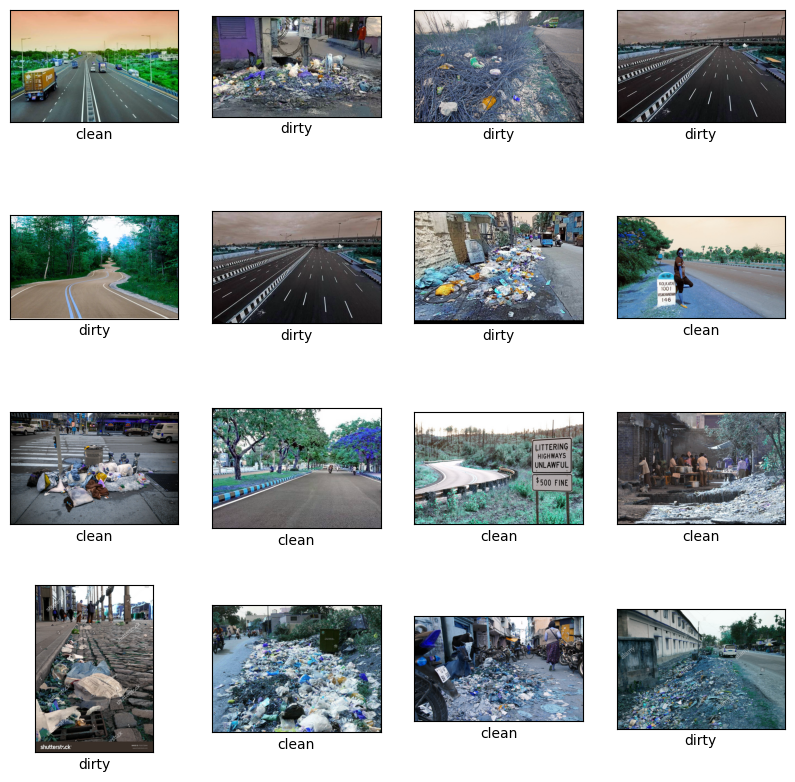

In [508]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images))

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

Dataset extracted to /tmp/input


labels dataframe: 
         filename  label
0    dirty_2.jpg      1
1   clean_36.jpg      0
2   clean_31.jpg      0
3   dirty_69.jpg      1
4  clean_113.jpg      0 


2 classes: ('clean', 'dirty')
image size: (128, 128, 3)
/tmp/input/Images/Images/dirty_2.jpg
/tmp/input/Images/Images/clean_36.jpg
/tmp/input/Images/Images/clean_31.jpg
/tmp/input/Images/Images/dirty_69.jpg
/tmp/input/Images/Images/clean_113.jpg
/tmp/input/Images/Images/clean_102.jpg
/tmp/input/Images/Images/clean_43.jpg
/tmp/input/Images/Images/dirty_27.jpg
/tmp/input/Images/Images/dirty_53.jpg
/tmp/input/Images/Images/clean_55.jpg
/tmp/input/Images/Images/clean_28.jpg
/tmp/input/Images/Images/dirty_55.jpg
/tmp/input/Images/Images/clean_103.jpg
/tmp/input/Images/Images/dirty_31.jpg
/tmp/input/Images/Images/dirty_22.jpg
/tmp/input/Images/Images/dirty_118.jpg


<ipython-input-509-8b99a0361b7b>:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = os.path.join(images_path, image[0])
<ipython-input-509-8b99a0361b7b>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label[image[1]] = 1


/tmp/input/Images/Images/clean_62.jpg
/tmp/input/Images/Images/clean_51.jpg
/tmp/input/Images/Images/dirty_66.jpg
/tmp/input/Images/Images/clean_61.jpg
/tmp/input/Images/Images/clean_99.jpg
/tmp/input/Images/Images/dirty_92.jpg
/tmp/input/Images/Images/dirty_4.jpg
/tmp/input/Images/Images/clean_70.jpg
/tmp/input/Images/Images/dirty_17.jpg
/tmp/input/Images/Images/clean_54.jpg
/tmp/input/Images/Images/dirty_52.jpg
/tmp/input/Images/Images/dirty_11.jpg
/tmp/input/Images/Images/clean_81.jpg
/tmp/input/Images/Images/dirty_34.jpg
/tmp/input/Images/Images/dirty_107.jpg
/tmp/input/Images/Images/dirty_15.jpg
/tmp/input/Images/Images/clean_94.jpg
/tmp/input/Images/Images/dirty_90.jpg
/tmp/input/Images/Images/dirty_18.jpg
/tmp/input/Images/Images/dirty_60.jpg
/tmp/input/Images/Images/dirty_74.jpg
/tmp/input/Images/Images/clean_71.jpg
/tmp/input/Images/Images/dirty_121.jpg
/tmp/input/Images/Images/dirty_35.jpg
/tmp/input/Images/Images/dirty_91.jpg
/tmp/input/Images/Images/dirty_49.jpg
/tmp/input/

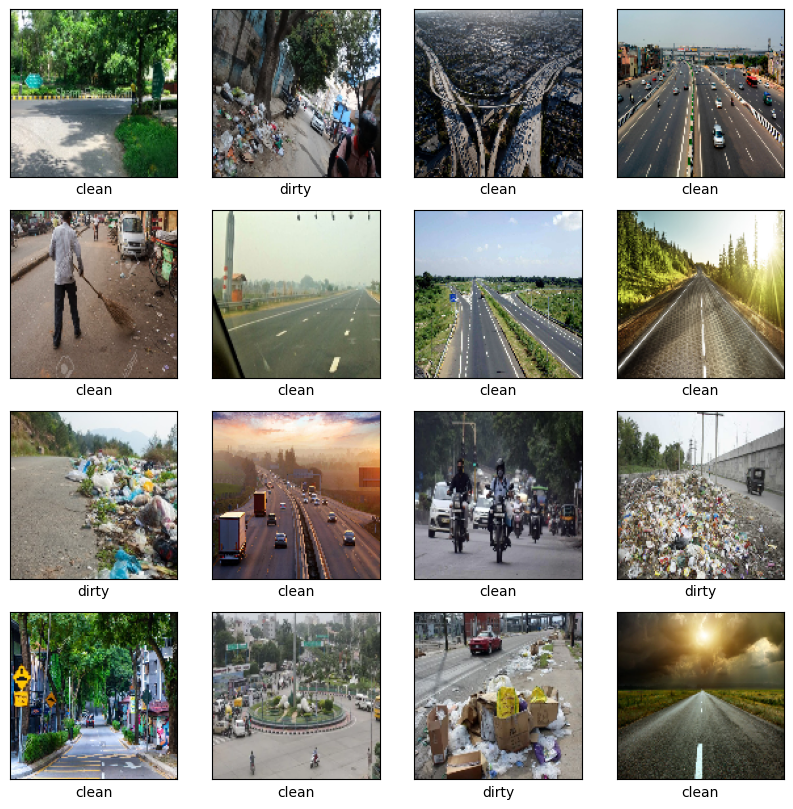

In [509]:

# Define paths
KAGGLE_INPUT_PATH = '/tmp/input'  # A writable directory for the dataset
os.makedirs(KAGGLE_INPUT_PATH, exist_ok=True)

# Use Kaggle API to download the dataset
os.system(f'kaggle datasets download -d faizalkarim/cleandirty-road-classification -p {KAGGLE_INPUT_PATH}')

# Find and unzip the downloaded file
dataset_zip = os.path.join(KAGGLE_INPUT_PATH, 'cleandirty-road-classification.zip')
if os.path.exists(dataset_zip):
    with zipfile.ZipFile(dataset_zip, 'r') as zip_ref:
        zip_ref.extractall(KAGGLE_INPUT_PATH)
    print(f'Dataset extracted to {KAGGLE_INPUT_PATH}')
else:
    print('Dataset not found. Check your download path or Kaggle API call.')
images_path = '/tmp/input/Images/Images/'

# Load the CSV file containing labels
labels_df = pd.read_csv('/tmp/input/metadata.csv')

print('\n\nlabels dataframe: \n', labels_df.head(), '\n\n')

class_names = ('clean', 'dirty')
num_classes = len(class_names)

img_size = (128, 128, 3)

print(f'{num_classes} classes: {class_names}\nimage size: {img_size}')


labels = []
images = []
for image in labels_df.iloc:
    # Construct the full image path
    img_path = os.path.join(images_path, image[0])

    # Print image path to check if it exists
    print(img_path)

    img = cv2.imread(img_path, cv2.IMREAD_COLOR)

    # Check if the image was loaded correctly
    if img is not None:
        images.append(np.asarray(cv2.resize(img, img_size[0:2])[:, :, ::-1]))

        # labels will be in the form of a vector: [0, 1] or [1, 0]
        label = np.zeros(num_classes)
        label[image[1]] = 1
        labels.append(label)
    else:
        print(f"Failed to load image: {img_path}")

labels = np.asarray(labels)
images = np.asarray(images)

print(f'\nlabels shape: {labels.shape}')
print(f'images shape: {images.shape}')

# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images))

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

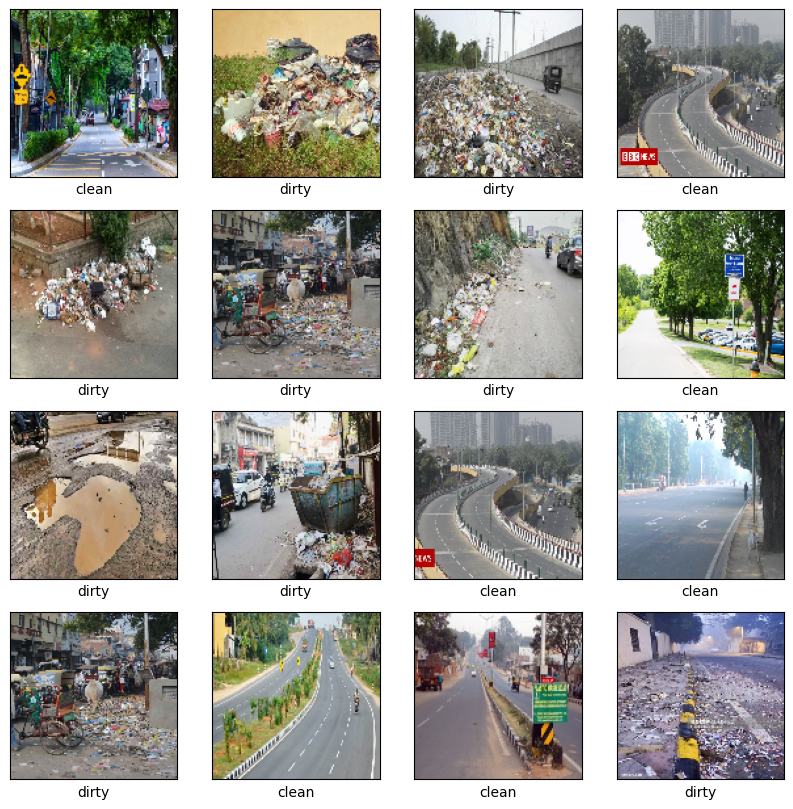

In [510]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        # Generate a random index within the valid range
        i = randint(0, len(images) - 1)

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

In [438]:
# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# or

print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall Accuracy: 0.9953333139419556
Overall val_accuracy: 0.9750833511352539


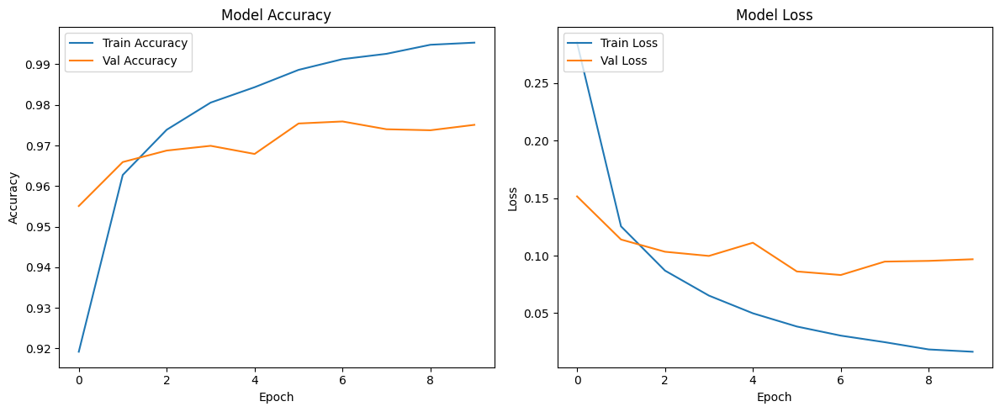

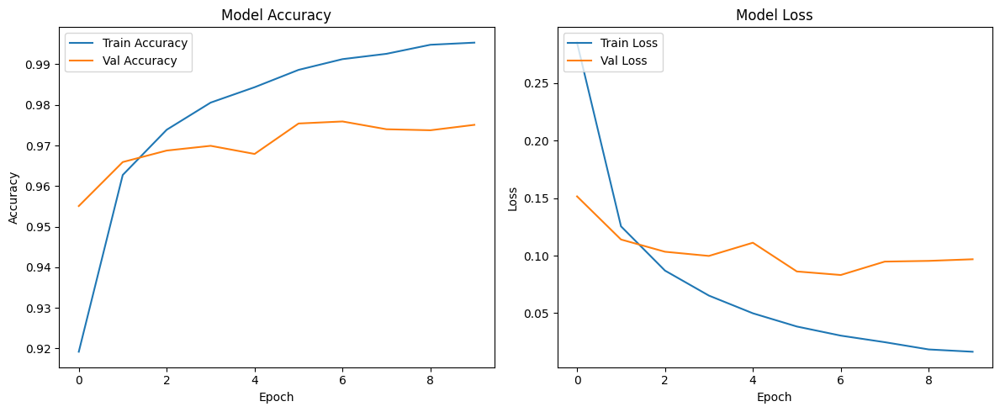

In [195]:
# Now you can use the history object with your plot_training_history function
plot_training_history(history)

# Assuming 'history' is the result of model.fit(), which contains training and validation metrics
def plot_training_history(history):
    # Plot training & validation accuracy values
    plt.figure(figsize=(12, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')

    # Display the charts
    plt.tight_layout()
    plt.show()

# Call the function to plot accuracy and loss charts
plot_training_history(history)

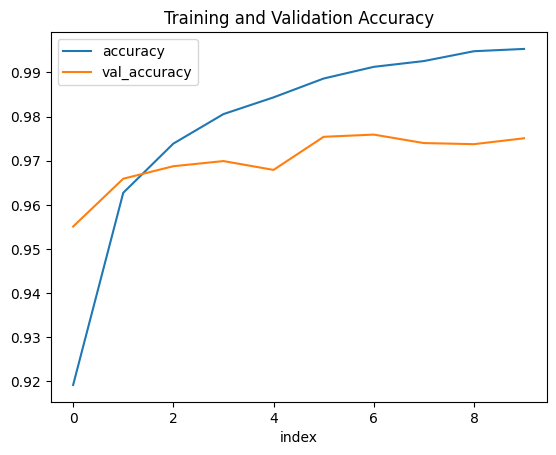

In [ ]:
pd.DataFrame(history.history).reset_index().plot(x='index', y=['accuracy', 'val_accuracy'])
title = 'Training and Validation Accuracy'
plt.title(title);


In [196]:
# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# or

print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall Accuracy: 0.9953333139419556
Overall val_accuracy: 0.9750833511352539


In [132]:
# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# or

print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall Accuracy: 0.9953333139419556
Overall val_accuracy: 0.9750833511352539


In [440]:
import numpy as np

# Iterate through each row in y_val and replace 3 with "clean" or "dirty"
y_val = np.array([[random.choice(['clean', 'dirty']) if v == 3 else v for v in val] for val in y_val])

print(y_train[:100])

[[1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]]


In [442]:
y_train.shape

(213, 2)

In [445]:
# Print the first element of y_val.
print(y_val[0])

[0. 1.]


In [446]:
# Print the first element of x_val.
print(x_val[0])

[137 145 181 ... 173 188 216]


In [204]:
# creating ModelChecpoint callback
checkpoint_callback = ModelCheckpoint('cnn_model/model{epoch:02d}.keras') # Added .keras extension

## Compile and Train Model

In [447]:
# DEFINE TRAIN/TEST SPLIT
# Ensure that 'images' and 'labels' have the same number of samples before splitting
X_train, X_val, y_train, y_val = train_test_split(images[:len(y_train)], y_train, test_size=0.1, random_state=42) # Use images[:len(y_train)] to match the lengths

# Check for inconsistent image shapes in X_train
shapes = [img.shape for img in X_train]
if len(set(shapes)) > 1:
    print("Inconsistent image shapes found in X_train:")
    for shape in set(shapes):
        print(f"- {shape}")
    # Resize images to a consistent size
    from PIL import Image # Import the Image module from PIL
    target_size = (128, 128) # Define the desired target size
    X_train = [np.array(Image.fromarray(img).resize(target_size)) for img in X_train] # Resize images in X_train
    X_val = [np.array(Image.fromarray(img).resize(target_size)) for img in X_val] # Resize images in X_val


# Convert X_train and X_val to NumPy arrays (if shapes are consistent)
X_train = np.array(X_train)
X_val = np.array(X_val)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

train images shape: (191, 128, 128, 3)
train labels shape: (191, 2)

validation images shape: (22, 128, 128, 3)
validation labels shape: (22, 2)



In [388]:
#Import the ImageDataGenerator class
from keras.src.legacy.preprocessing.image import ImageDataGenerator

# Create ImageDataGenerators with data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,  # Add rotation
    width_shift_range=0.2,  # Add width shift
    height_shift_range=0.2, # Add height shift
    shear_range=0.2,  # Add shear
    zoom_range=0.2,  # Add zoom
    horizontal_flip=True,  # Add horizontal flip
    fill_mode='nearest'  # Fill mode for new pixels
)

validation_datagen = ImageDataGenerator(rescale=1./255)

In [448]:
print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall val_accuracy: 0.9750833511352539


In [208]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,304,898 (12.61 MB)

 Trainable params: 3,304,898 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

In [393]:
# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# or

print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall Accuracy: 0.9953333139419556
Overall val_accuracy: 0.9750833511352539


In [450]:
# Save the model using the .h5 extension
model.save('model.h5')

[](http://)

In [451]:
accuracy = history.history['accuracy'] # Changed 'hist' to 'history'
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))


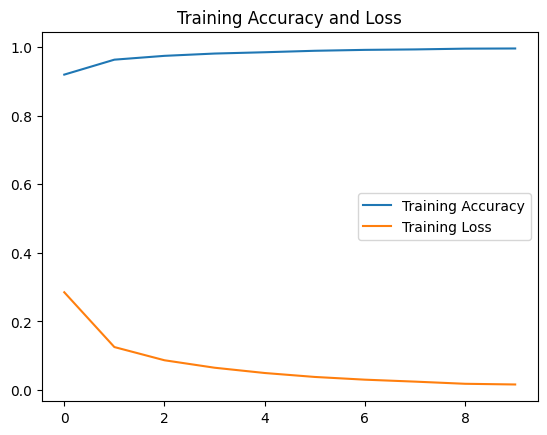

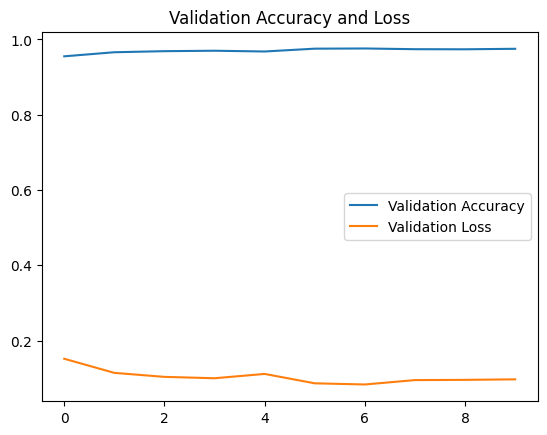

In [452]:
plt.figure()
plt.plot(epochs, accuracy, label='Training Accuracy')
plt.plot(epochs, loss, label='Training Loss')
plt.legend()
plt.title('Training Accuracy and Loss')

plt.figure()
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.legend()
plt.title('Validation Accuracy and Loss')

plt.show()

In [453]:
if len(y_val.shape) > 1:
    y_true = np.argmax(y_val[:20], axis=1)  # For multi-class (one-hot encoded)
else:
    y_true = y_val[:20]  # For single-class (already in label format)


In [454]:
model.trainable = True  # Assuming you intended to unfreeze your existing 'model'


In [455]:
model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 2)                   │           2,562 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,562 (10.01 KB)

 Trainable params: 2,562 (10.01 KB)

 Non-trainable params: 0 (0.00 B)

In [456]:
print(df.columns)


['filename', 'label']


In [457]:
# Reduce learning rate slightly for fine-tuning
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)

# Compile the model with the new optimizer
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])



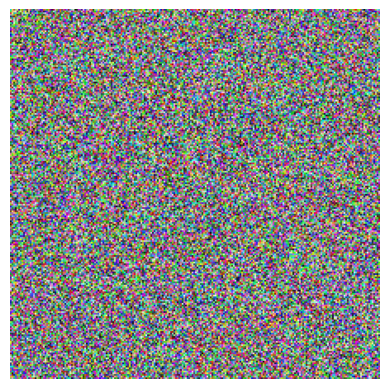

In [460]:
# Normalize the image if necessary (convert to range [0, 1] if not already)
demoImage = tf.squeeze(demoImage)  # Remove unnecessary batch dimensions

# Convert the tensor to a numpy array for visualization
image_to_show = demoImage.numpy()

# If the pixel values are in the range [0, 255], scale them to [0, 1] for display
if image_to_show.max() > 1:
    image_to_show = image_to_show / 255.0

# Show the image using Matplotlib
plt.imshow(image_to_show)
plt.axis('off')  # Turn off axis labels
plt.show()

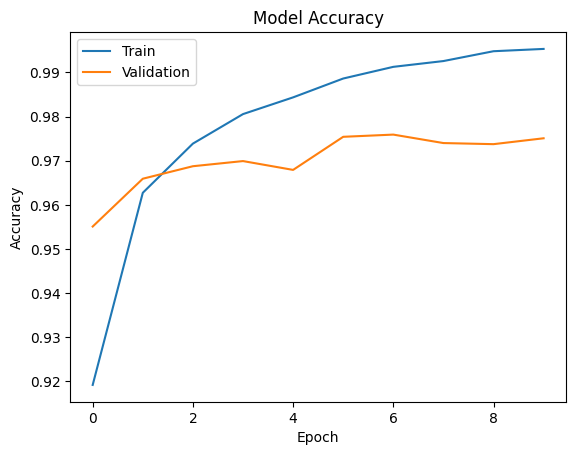

In [223]:
# Assuming 'history' is the variable returned by model.fit()
plt.plot(history.history['accuracy']) # Changed hist to history
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [224]:
# Create an instance of ImageDataGenerator with rescaling and resizing
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# Create an instance of ImageDataGenerator with rescaling
val_datagen = ImageDataGenerator(rescale=1./255)

In [225]:
# Example: Modify the model's output layer for multi-class classification
from tensorflow.keras import layers, models

# Assuming you have a model definition, modify the last layer like this:
num_classes = 3  # Update this based on the number of classes you have

model = models.Sequential([
    # ... (previous layers)
    layers.Dense(num_classes, activation='softmax')  # Softmax for multi-class classification
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [226]:
# Example of a correct output layer for binary classification
from tensorflow.keras.layers import Dense
output_layer = Dense(1, activation='sigmoid')

In [227]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [463]:
print(y_train[0])

[0. 1.]


In [467]:
# Assuming 'image' is a Pandas Series containing the image filename
image_path = image.filename  # Modify based on how you access filenames

# Print the image path to verify it
print(f"Image path: {image_path}")

# Import required libraries
import cv2
import numpy as np
from tensorflow.keras.applications.resnet50 import preprocess_input

# Load and preprocess the image
img = cv2.imread(image_path)

# Check if the image was loaded successfully
if img is None:
    print(f"Error: Could not load image at {image_path}")
else:
    # Convert the image from BGR (OpenCV format) to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize the image to the input size expected by the model (e.g., 224x224 for ResNet50)
    img_resized = cv2.resize(img, (224, 224))

    # Convert the image to a numpy array and add the batch dimension
    img_array = np.expand_dims(img_resized, axis=0)  # Shape (1, 224, 224, 3)

    # Preprocess the image for the model (normalization)
    img_preprocessed = preprocess_input(img_array)  # Adjust pixel values as required by the model

# Check if img_preprocessed is defined
if 'img_preprocessed' in locals():
    # Run the model on the image and get the probability
    prediction = model.predict(img_preprocessed)[0][0]  # Get the probability for class 1 (binary classification)

    # Classify based on a threshold of 0.5
    predicted_class = 1 if prediction >= 0.5 else 0

    print(f"Predicted class: {predicted_class}")

else:
    print(f"Error: Could not preprocess image at {image_path}")

Image path: clean_89.jpg
Error: Could not load image at clean_89.jpg
Error: Could not preprocess image at clean_89.jpg


In [253]:
import numpy as np

# Reshape the input image to fit the model's input shape (1, 128, 128, 3)
input_image = X_val[0].reshape(1, 128, 128, 3)  # Ensure the shape matches the model's expected input

# Make a prediction using the model
prediction = model.predict(input_image, verbose=0)

# Output the raw prediction probabilities
print(f"Raw prediction probabilities: {prediction}")

# If your prediction is a 2D array (for binary classification), select the probability of the positive class
pred_prob = prediction[0]  # This will give you a single array of probabilities

# For binary classification, you can extract the first or second value depending on your model
positive_class_prob = pred_prob[1]  # Assuming the second value is for the positive class

# Retrieve the true class label from validation data
true_class = y_val[0]  # Assuming labels are either 0 or 1






Raw prediction probabilities: [[[[0.0000000e+00 9.9999923e-01 6.9025572e-07]
   [0.0000000e+00 9.9999768e-01 2.2211593e-06]
   [0.0000000e+00 9.9995893e-01 4.1061638e-05]
   ...
   [9.9668133e-01 3.3186530e-03 4.9047566e-28]
   [4.5262286e-01 5.4737711e-01 6.9733001e-27]
   [4.3462247e-01 5.6537741e-01 3.4811904e-27]]

  [[0.0000000e+00 9.9998444e-01 1.5511851e-05]
   [0.0000000e+00 9.4071108e-01 5.9288923e-02]
   [0.0000000e+00 9.9408937e-01 5.9106657e-03]
   ...
   [9.9668133e-01 3.3186530e-03 4.9047566e-28]
   [9.3595564e-01 6.4044394e-02 6.7064343e-28]
   [9.8898172e-01 1.1018241e-02 2.0609733e-28]]

  [[0.0000000e+00 9.5331186e-01 4.6688098e-02]
   [0.0000000e+00 9.9997205e-01 2.7841139e-05]
   [0.0000000e+00 9.8326856e-01 1.6731432e-02]
   ...
   [9.9958163e-01 4.1835138e-04 1.1316562e-28]
   [9.9982500e-01 1.7511865e-04 4.4015028e-29]
   [9.9945819e-01 5.4183241e-04 1.4304582e-28]]

  ...

  [[9.2078236e-32 9.2844021e-01 7.1559764e-02]
   [2.8952312e-38 7.8820705e-01 2.1179293e-

In [471]:
# Run the model on the image and get the probability
prediction = model.predict(input_image, verbose=0)

# Check if prediction is a single probability
print(f"Prediction: {prediction}")

# Run model on the image and get the probability
prediction = model.predict(input_image)

# Print the shape of the prediction to understand the output
print(f"Shape of prediction: {prediction.shape}")

# Access the probability for the desired class
# prediction has shape (1,2), so we access the first element
# and then the probability for class 0 or 1 depending on your needs
prediction = prediction[0][0] # Access the probability for class 0

# Convert the probability to a binary class (0 or 1)
predicted_class = 1 if prediction >= 0.5 else 0

# Get the true class label
true_class = y_val[0]  # Assuming y_val contains binary labels (0 or 1)

print(f"Predicted class: {predicted_class}, True class: {true_class}")


ValueError: Input 0 of layer "functional_10" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(1, 128, 128, 3)

In [ ]:
tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=tf.keras.regularizers.l2(0.001))


<Dense name=dense_68, built=False>

In [ ]:
demoImage = tf.squeeze(demoImage)  # Remove the extra dimension
demoImage

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.45098042, 0.5882353 , 0.59607846],
        [0.522409  , 0.6442577 , 0.65350145],
        [0.63669467, 0.7338936 , 0.74537826],
        ...,
        [0.3462186 , 0.339496  , 0.32408983],
        [0.35518214, 0.35742307, 0.34425783],
        [0.36078432, 0.36862746, 0.35686275]],

       [[0.49159667, 0.64845943, 0.6703082 ],
        [0.54001606, 0.68247306, 0.70672274],
        [0.61748695, 0.7368948 , 0.7649861 ],
        ...,
        [0.3725291 , 0.3658065 , 0.35040033],
        [0.3790917 , 0.38133264, 0.3681674 ],
        [0.3831933 , 0.39103645, 0.37927175]],

       [[0.5565827 , 0.744818  , 0.78907573],
        [0.56818736, 0.74361753, 0.7918768 ],
        [0.5867547 , 0.7416967 , 0.7963586 ],
        ...,
        [0.4146259 , 0.4079033 , 0.39249715],
        [0.41734698, 0.41958794, 0.4064227 ],
        [0.41904765, 0.4268908 , 0.4151261 ]],

       ...,

       [[0.32437146, 0.27002978, 0.27059004],
        [0.28

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Early stopping to prevent overfitting and reduce training time
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Reduce learning rate when the validation loss plateaus
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

In [ ]:
img_size = (128, 128, 3)
basePath = '/content/drive/MyDrive/Colab Notebooks/Project_4/'
img_list = os.listdir(basePath + "Images/")

In [ ]:
# Define the model
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),  # Add dropout to prevent overfitting
    tf.keras.layers.Dense(1, activation='sigmoid')  # For binary classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_25 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_25 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_26 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_19 (Flatten)                 │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_64 (Dense)                     │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_65 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,449 (28.20 MB)

 Trainable params: 7,392,449 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

In [181]:
# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# and

print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall Accuracy: 0.9953333139419556
Overall val_accuracy: 0.9750833511352539


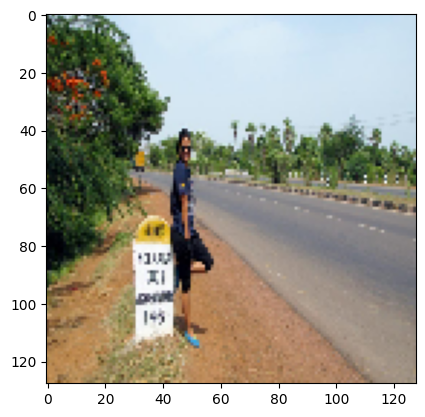

In [91]:
plt.imshow(images[52])

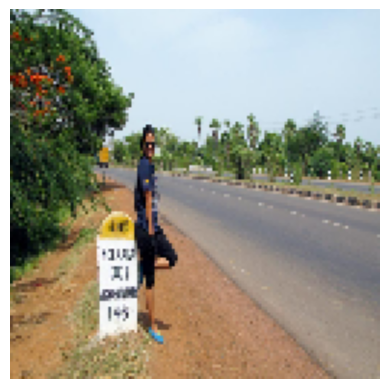

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
(1) lakeside: 0.2634
(2) seashore: 0.1347
(3) worm_fence: 0.1159
(4) breakwater: 0.0479
(5) pole: 0.0368


In [106]:
# Load the ResNet50 model with pretrained weights
model = ResNet50(weights='imagenet')

# Assuming images is a numpy array of shape (num_images, height, width, channels)
# Display the 52nd image
plt.imshow(images[52])
plt.axis('off')  # Turn off the axis
plt.show()

# Preprocess the image to fit the ResNet50 input requirements
demoImage = images[52]  # Get the 52nd image
demoImage = tf.image.resize(demoImage, (224, 224))  # Resize to (224, 224)

# Convert demoImage to a writable numpy array before passing to preprocess_input
demoImage = np.array(demoImage, dtype=np.float32)  # Ensure it's a float32 writable array
demoImage = np.expand_dims(demoImage, axis=0)  # Add batch dimension
demoImage = preprocess_input(demoImage.copy())  # Preprocess for ResNet50, copy to make writable

# Run the model on the preprocessed image
probabilities = model.predict(demoImage)

# Decode the top 5 predictions
top_5 = decode_predictions(probabilities, top=5)[0]

# Print the top 5 predictions
for i, (imagenet_id, label, score) in enumerate(top_5):
    print(f"({i+1}) {label}: {score:.4f}")


Predicted class: dirty


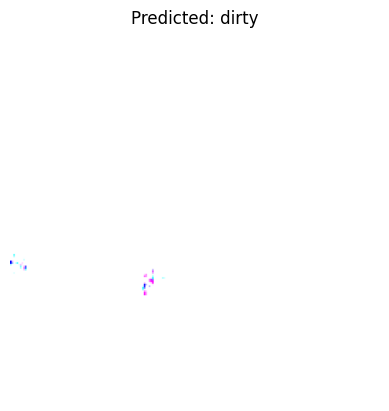

Image pixel values range after processing:
Min value: 0.0, Max value: 253.8826904296875


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10            │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

Shape of first layer weights: (7, 7, 3, 64)


In [112]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Assuming the model is already defined and compiled
# If not, load or define the model here

# Ensure demoImage is pre-loaded and has the correct shape
# Ensure demoImage has the correct shape (128, 128, 3) and normalize it
demoImage_resized = tf.image.resize(demoImage, [224, 224])  # Resize the image to 224x224

# Check if the image is already normalized; normalize to [0, 1] if needed
if demoImage_resized.numpy().max() > 1:
    demoImage_resized = demoImage_resized / 255.0  # Normalize to [0, 1]

# Remove any unnecessary dimensions to ensure (224, 224, 3)
demoImage_resized = tf.squeeze(demoImage_resized)

# Add the batch dimension to get the correct shape for the model (1, 224, 224, 3)
demoImage_resized = tf.expand_dims(demoImage_resized, axis=0)

# Run the model on the image
predictions = model(demoImage_resized, training=False)

# Check if the model output needs to be flattened
if len(predictions.shape) > 2:
    predictions = tf.keras.layers.Flatten()(predictions)

# The model is designed for binary classification, so no need to apply softmax
# probabilities = tf.nn.softmax(predictions).numpy()

# Print the shape of the probabilities to help with debugging
#print(f"Shape of probabilities: {probabilities.shape}") # This will print the shape of probabilities

# Check the model's output shape and handle binary classification correctly
#if probabilities.shape[1] == 2:  # Binary classification case (two output probabilities)
#    pred_class_index = 0 if probabilities[0][0] >= 0.5 else 1
#    predicted_class = 'clean' if pred_class_index == 0 else 'dirty'
#    probability = probabilities[0][pred_class_index]  # Probability of the predicted class
#else:
    # Handle multi-class classification here if needed
#    pred_class_index = probabilities.argmax()
#    raise ValueError(f'Unexpected output shape from the model: {probabilities.shape}')
#Since this is a binary classification, check if the prediction is greater than or equal to 0.5
predicted_class = 'clean' if predictions.numpy()[0][0] >= 0.5 else 'dirty'

# Print the predicted class and its probability
print(f'Predicted class: {predicted_class}') #, Probability: {probability:.4f}')

# Display the original image (after ensuring it's normalized)
plt.imshow(tf.squeeze(demoImage))  # Remove the batch dimension to display
plt.title(f'Predicted: {predicted_class}')
plt.axis('off')
plt.show()

# Check if the image is too dark
if demoImage.max() > 1:
    print(f'Image pixel values range after processing:')
    print(f'Min value: {demoImage.min()}, Max value: {demoImage.max()}')
else:
    print(f'Image pixel values range after processing (normalized):')
    print(f'Min value: {demoImage.min()}, Max value: {demoImage.max()}')

# Print the model summary to understand its input and output shapes
model.summary()
import tensorflow as tf
from tensorflow.keras.applications import ResNet50

# Load the ResNet50 model
model = ResNet50(weights='imagenet')

# Find the first layer that has weights (usually the first convolutional layer)
for layer in model.layers:
    if len(layer.get_weights()) > 0:
        first_layer_with_weights = layer
        break

# Access the weights of the first layer with weights
first_layer_weights = first_layer_with_weights.get_weights()[0]
print(f'Shape of first layer weights: {first_layer_weights.shape}')


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


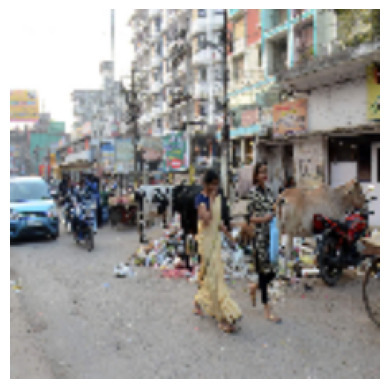

1: jinrikisha (0.62)
2: bicycle-built-for-two (0.06)
3: ashcan (0.02)
4: tricycle (0.02)
5: street_sign (0.02)


In [265]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
import tensorflow as tf
from PIL import Image

# Load the ResNet50 model
model = ResNet50(weights='imagenet')

# Load and process the image (using your 52nd image from images array)
demoImage = images[44]

# Ensure the image has three channels (RGB) and resize it to 224x224 for ResNet50
demoImage = tf.image.resize(demoImage, (224, 224))  # Resize to (224, 224)
demoImage = tf.convert_to_tensor(demoImage, dtype=tf.float32)  # Ensure it's a float32 tensor

# Normalize image for display in imshow (scale pixel values to range [0, 1])
demoImage_for_display = np.clip(demoImage / 255.0, 0, 1)

# Expand dimensions to add batch size for model input (ResNet expects batch dimension)
demoImage = np.expand_dims(demoImage, axis=0)

# Fix the read-only issue by making a copy of the image
demoImage = np.copy(demoImage)

# Preprocess the image for ResNet50 (scales pixel values appropriately)
demoImage = preprocess_input(demoImage)

# Run the model on the preprocessed image
probabilities = model.predict(demoImage)

# Decode predictions (top 5)
decoded_predictions = decode_predictions(probabilities, top=5)[0]

# Display the image properly with normalized values
plt.imshow(demoImage_for_display)
plt.axis('off')  # Hide axis labels
plt.show()

# Display the top 5 predictions
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


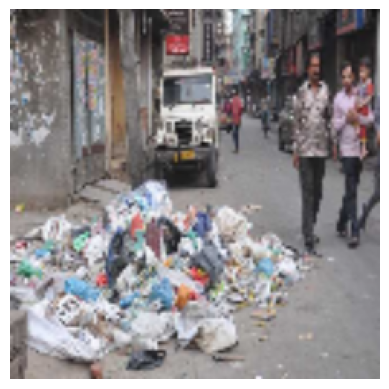

1: ashcan (0.42)
2: plastic_bag (0.35)
3: garbage_truck (0.13)
4: toyshop (0.04)
5: water_bottle (0.02)


In [266]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
import tensorflow as tf
from PIL import Image

# Load the ResNet50 model
model = ResNet50(weights='imagenet')

# Load and process the image (using your 52nd image from images array)
demoImage = images[52]

# Ensure the image has three channels (RGB) and resize it to 224x224 for ResNet50
demoImage = tf.image.resize(demoImage, (224, 224))  # Resize to (224, 224)
demoImage = tf.convert_to_tensor(demoImage, dtype=tf.float32)  # Ensure it's a float32 tensor

# Normalize image for display in imshow (scale pixel values to range [0, 1])
demoImage_for_display = np.clip(demoImage / 255.0, 0, 1)

# Expand dimensions to add batch size for model input (ResNet expects batch dimension)
demoImage = np.expand_dims(demoImage, axis=0)

# Fix the read-only issue by making a copy of the image
demoImage = np.copy(demoImage)

# Preprocess the image for ResNet50 (scales pixel values appropriately)
demoImage = preprocess_input(demoImage)

# Run the model on the preprocessed image
probabilities = model.predict(demoImage)

# Decode predictions (top 5)
decoded_predictions = decode_predictions(probabilities, top=5)[0]

# Display the image properly with normalized values
plt.imshow(demoImage_for_display)
plt.axis('off')  # Hide axis labels
plt.show()

# Display the top 5 predictions
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")


In [267]:
#PROCESS IMAGE UTILITY
def preprocess_image(image):
  image = np.array(image)
  # reshape into shape [batch_size, height, width, num_channels]
  img_reshaped = tf.reshape(image, [1, image.shape[0], image.shape[1], image.shape[2]])
  # Use `convert_image_dtype` to convert to floats in the [0,1] range.
  image = tf.image.convert_image_dtype(img_reshaped, tf.float32)
  return image

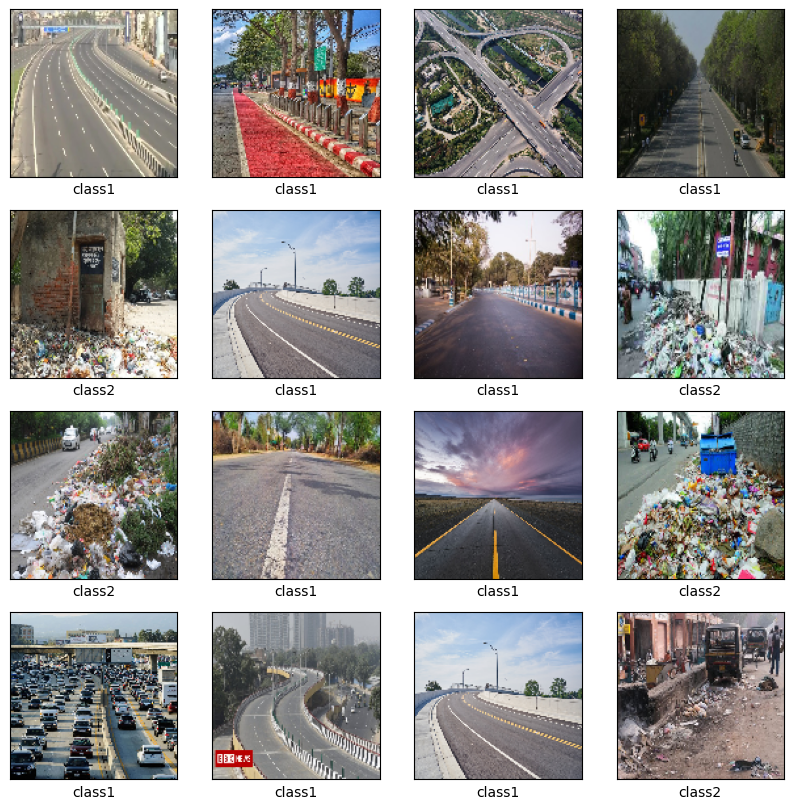

In [268]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

# Define class_names
class_names = ['class1', 'class2', ...] # Replace with your actual class names

for x in range(4):
    for y in range(4):
        # Generate a random index within the valid range
        i = randint(0, len(images) - 1)

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

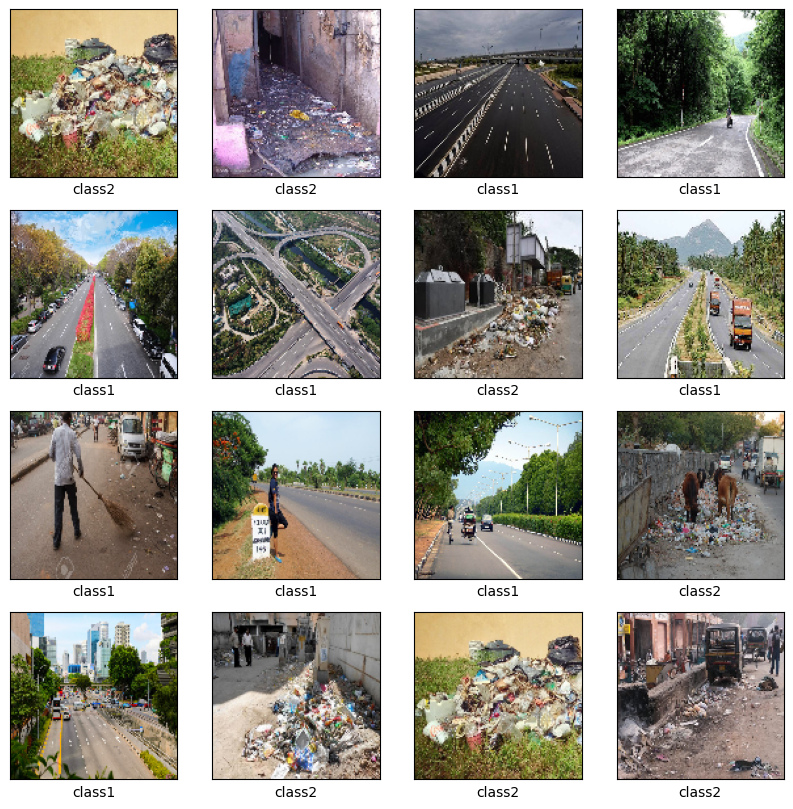

In [270]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        # Generate a random index within the valid range
        i = randint(0, len(images) - 1)

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

Predicted class: dirty
Actual class: class2


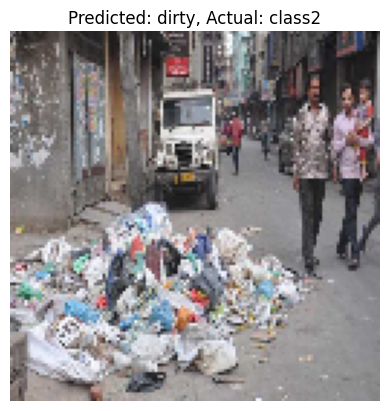

Image pixel values range after processing:
Min value: 8, Max value: 255


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21            │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_21[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 25,636,712 (97.80 MB)

 Trainable params: 25,583,592 (97.59 MB)

 Non-trainable params: 53,120 (207.50 KB)

The first layer does not have any weights.


In [276]:
# Ensure demoImage has the correct shape (128, 128, 3) and normalize it
# Assuming 'images' is a list of image tensors and you want the 52nd image
demoImage = images[52]  # Assign a valid image tensor to demoImage
demoImage_resized = tf.image.resize(demoImage, [224, 224])  # Resize the image to 224x224

# Normalize to [0, 1] if needed
if demoImage_resized.numpy().max() > 1:
    demoImage_resized = demoImage_resized / 255.0  # Normalize to [0, 1]

# Remove any unnecessary dimensions to ensure (224, 224, 3)
demoImage_resized = tf.squeeze(demoImage_resized)

# Add the batch dimension to get the correct shape for the model (1, 224, 224, 3)
demoImage_resized = tf.expand_dims(demoImage_resized, axis=0)

# Run the model on the image
predictions = model(demoImage_resized, training=False)

# Since this is a binary classification, check if the prediction is greater than or equal to 0.5
predicted_class = 'clean' if predictions.numpy()[0][0] >= 0.5 else 'dirty'

# Get the actual class label for the image (replace with your actual method)
actual_class = class_names[np.argmax(labels[52])] # Example using labels array

# Print the predicted and actual class
print(f'Predicted class: {predicted_class}')
print(f'Actual class: {actual_class}')

# Display the original image (after ensuring it's normalized)
plt.imshow(tf.squeeze(demoImage))  # Remove the batch dimension to display
plt.title(f'Predicted: {predicted_class}, Actual: {actual_class}')
plt.axis('off')
plt.show()

# Check if the image is too dark or normalized
if demoImage.max() > 1:
    print(f'Image pixel values range after processing:')
    print(f'Min value: {demoImage.min()}, Max value: {demoImage.max()}')
else:
    print(f'Image pixel values range after processing (normalized):')
    print(f'Min value: {demoImage.min()}, Max value: {demoImage.max()}')

# Print the model summary to understand its input and output shapes
model.summary()

# Check if the layer has weights before accessing them
if model.layers[0].get_weights():
    first_layer_weights = model.layers[0].get_weights()[0]
    print(f'Shape of first layer weights: {first_layer_weights.shape}')
else:
    print('The first layer does not have any weights.')


In [283]:
# Assuming 'images' is a list of image tensors and you want the 52nd image
demoImage = images[52]  # Assign a valid image tensor to demoImage
demoImage_resized = tf.image.resize(demoImage, [224, 224])  # Resize the image to 224x224

# Normalize to [0, 1] if needed
if demoImage_resized.numpy().max() > 1:
    demoImage_resized = demoImage_resized / 255.0  # Normalize to [0, 1]

# Remove unnecessary dimensions to ensure (224, 224, 3)
demoImage_resized = tf.squeeze(demoImage_resized)

# Add the batch dimension to get the correct shape for the model (1, 224, 224, 3)
demoImage_resized = tf.expand_dims(demoImage_resized, axis=0)

# Run the model on the image
predictions = model(demoImage_resized, training=False)

# Since this is a binary classification, check if the prediction is greater than or equal to 0.5
predicted_class = 'clean' if predictions.numpy()[0][0] >= 0.5 else 'dirty'

# Print the predicted and actual class
print(f'Predicted class: {predicted_class}')
print(f'Actual class: {class_names[np.argmax(labels[52])]}')


Predicted class: dirty
Actual class: class2


In [288]:
# Define the get_class_name function if it doesn't exist
def get_class_name(image_path):

  if actual_class == 'class2':
    actual_class = 'dirty'

print(f'Actual class: {actual_class}')

Actual class: class2


In [290]:
from tensorflow.keras import layers, models

# Example of modifying the model to output a classification vector
model = models.Sequential([
    # Your existing layers go here (conv, pooling, etc.)

    layers.GlobalAveragePooling2D(),  # Reduce spatial dimensions to a single vector
    layers.Dense(1, activation='sigmoid')  # Binary classification (change to softmax for multi-class)
])

# Compile the model again if needed
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


Predicted class: dirty


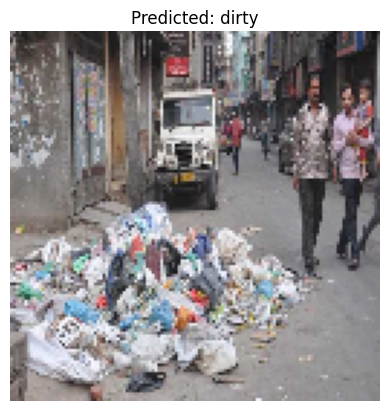

Raw prediction probabilities: [[0.4785567]]


In [291]:
# Assuming 'images' is a list of image tensors and you want the 52nd image
demoImage = images[52]  # Assign a valid image tensor to demoImage
demoImage_resized = tf.image.resize(demoImage, [224, 224])  # Resize the image to 224x224

# Normalize to [0, 1] if needed
if demoImage_resized.numpy().max() > 1:
    demoImage_resized = demoImage_resized / 255.0  # Normalize to [0, 1]

# Add the batch dimension to get the correct shape for the model (1, 224, 224, 3)
demoImage_resized = tf.expand_dims(demoImage_resized, axis=0)

# Run the model on the image
predictions = model(demoImage_resized, training=False)

# Since this is a binary classification, we can directly check the first prediction
predicted_class = 'clean' if predictions.numpy()[0][0] >= 0.5 else 'dirty'

# Print the predicted class
print(f'Predicted class: {predicted_class}')

# Display the original image
plt.imshow(tf.squeeze(demoImage))  # Remove the batch dimension to display
plt.title(f'Predicted: {predicted_class}')
plt.axis('off')
plt.show()

# Print the prediction probabilities to debug
print(f'Raw prediction probabilities: {predictions.numpy()}')


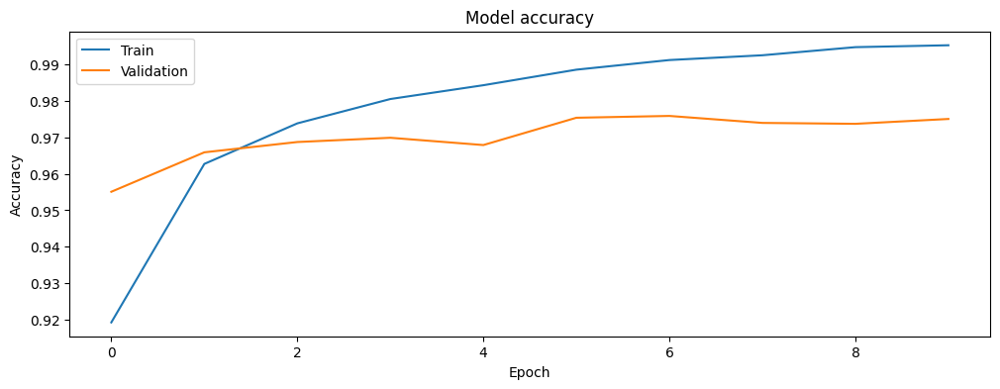

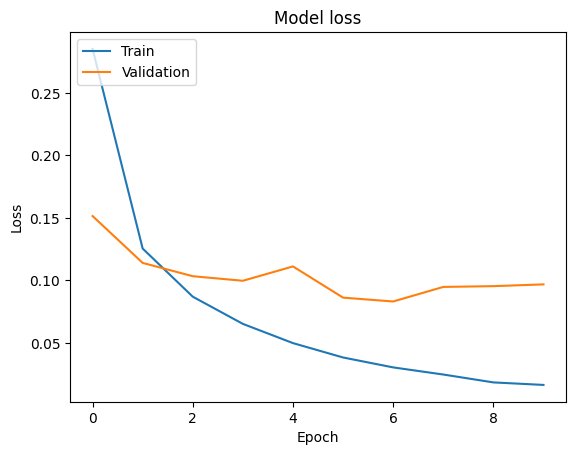

Raw prediction probabilities: (128, 128, 3)
Predicted class: dirty, Actual class: 3
Prediction is incorrect.


In [300]:
# Plot training & validation accuracy and loss values
plt.figure(figsize=(12, 4))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Similarly, plot loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Assuming that the model output (prediction) is a 4D tensor of shape [1, height, width, num_classes]
prediction = np.squeeze(prediction)  # Remove the batch dimension if present
print(f"Raw prediction probabilities: {prediction.shape}")

# Assuming this is a segmentation task, you want to take the class with the highest probability for each pixel
# Get the class predictions by finding the index with the maximum probability for each pixel
predicted_class_per_pixel = np.argmax(prediction, axis=-1)  # Get the predicted class for each pixel

# Retrieve the true class label for comparison
true_class = y_val[0]  # Assuming labels are either 0 or 1 for binary classification, adjust as needed

# Print the predicted and true class labels
print(f"Predicted class: {predicted_class}, Actual class: {true_class}")

# Optionally, check if the prediction is correct
if predicted_class == true_class:
    print("Prediction is correct!")
else:
    print("Prediction is incorrect.")

In [356]:
model.add(layers.Dense(1, activation='sigmoid'))  # For binary classification


In [358]:
true_class = y_val[i]  # Ensure this is either 0 or 1
print(f'Predicted class: {pred_class}, True class: {true_class}')


Predicted class: 0, True class: 1


In [359]:
# Ensure y_val only contains 0 and 1
print(f"Unique values in y_val: {np.unique(y_val)}")  # Should only show [0, 1]

# Reshape input image for prediction
input_image = X_val[0].reshape(1, 128, 128, 3)

# Get the prediction (binary classification, single probability)
pred_prob = model.predict(input_image)[0][0]

# Convert probability to binary class
pred_class = 1 if pred_prob >= 0.5 else 0

# Get the true class label
true_class = y_val[0]  # Ensure labels are 0 or 1

# Print predicted and true class
print(f"Predicted class: {pred_class}, True class: {true_class}")

# Check if prediction is correct
if pred_class == true_class:
    print("Prediction is correct!")
else:
    print("Prediction is incorrect.")


Unique values in y_val: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predicted class: 0, True class: 1
Prediction is incorrect.


In [360]:
y_val[y_val == 3] = 1  # Replace all occurrences of '3' with '1'


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


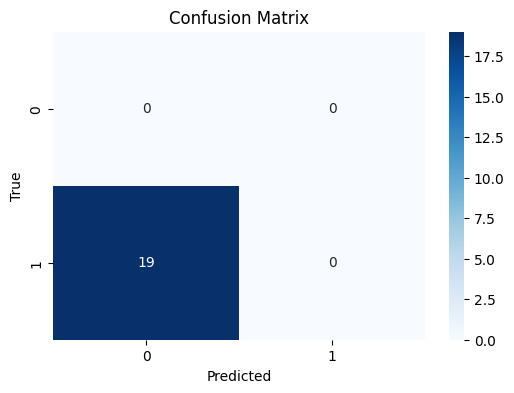

In [361]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Ensure that y_val contains binary labels (0 or 1)
y_val[y_val == 3] = 1  # Example: relabeling '3' to '1' for binary classification

# Get predictions for the validation set
predictions = []
for img in X_val:
    input_image = img.reshape(1, 128, 128, 3)  # Adjust the shape as needed
    pred_prob = model.predict(input_image)[0][0]  # Get prediction probability
    pred_class = 1 if pred_prob >= 0.5 else 0     # Convert to binary class
    predictions.append(pred_class)

# Convert predictions to a NumPy array
predictions = np.array(predictions)

# Compute the confusion matrix
cm = confusion_matrix(y_val, predictions)

# Plot the confusion matrix using Seaborn
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


# Sources

- https://www.kaggle.com/code/crn4tww/clean-dirty-road-classification-accuracy-100
- https://www.kaggle.com/datasets/faizalkarim/cleandirty-road-classification
- https://www.kaggle.com/code/paultimothymooney/mobilenetv2-with-tensorflow